
## 1. Initial setup

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

In [4]:
cv2.__version__

'4.5.2'

In [5]:
dataset_dir = "data/modelling/"
raw_dir = "raw"
masks_dir = "masks"

In [6]:
# sample image
sample_img = cv2.imread(os.path.join(dataset_dir, raw_dir, "Sandstone_Versa0000.tif"))
sample_img_mask = cv2.imread(os.path.join(dataset_dir, masks_dir, "Sandstone_Versa0000.tif"))
print(f"Raw: {sample_img.shape}")
print(f"Mask: {sample_img_mask.shape}")

Raw: (1024, 996, 3)
Mask: (1024, 996, 3)


Raw new shape: (1024, 996)
Mask new shape: (1024, 996)


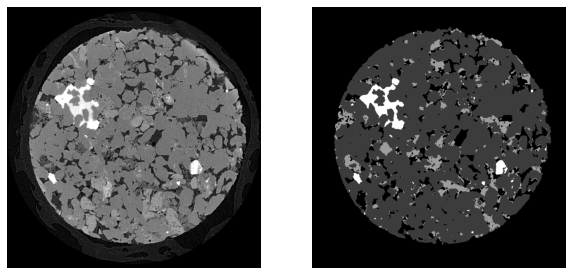

In [7]:
# converting to grayscale
sample_img_gray = cv2.cvtColor(sample_img, cv2.COLOR_BGR2GRAY)
sample_img_mask_gray = cv2.cvtColor(sample_img_mask, cv2.COLOR_BGR2GRAY)
print(f"Raw new shape: {sample_img_gray.shape}")
print(f"Mask new shape: {sample_img_mask_gray.shape}")
fig, axes = plt.subplots(1,2, sharex=True, sharey=True, figsize=(10,8));
axes[0].imshow(sample_img_gray, cmap="gray");
axes[0].axis("off")
axes[1].imshow(sample_img_mask_gray, cmap="gray");
axes[1].axis("off")
plt.axis("off")
plt.show()

## 2. Dataset preparation

In [8]:
dataset = pd.DataFrame()

In [9]:
dataset["Raw"] = sample_img_gray.reshape(-1)
dataset["Label"] = sample_img_mask_gray.reshape(-1)
print(f"Raw: {dataset['Raw'].shape}")
print(f"Labelled: {dataset['Label'].shape}")

Raw: (1019904,)
Labelled: (1019904,)


In [10]:
# Filter banking

def generate_edge_detection_filters(original_img):
    edge_detected = pd.DataFrame()
    
    # canny edge operator
    thresh1 = 150
    thresh2 = 200
    
    # Sobel edge operator
    kernel_Sobel_x = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]])
    kernel_Sobel_y = np.array([
        [1, 2, 1],
        [0, 0, 0],
        [-1, -2, -1]])
    
    # Prewitt edge operator
    kernel_Prewitt_x = np.array([
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]])
    kernel_Prewitt_y = np.array([
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]])
    
    # Laplacian edge operator
    kernel_Laplacian_1 = np.array([
        [1, 1, 1],
        [1, -8, 1],
        [1, 1, 1]])
    kernel_Laplacian_2 = np.array([
        [2, -1, 2],
        [-1, -4, -1],
        [2, 1, 2]])
    
    output_1 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Prewitt_x)
    output_2 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Prewitt_y)
    output_3 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Sobel_x)
    output_4 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Sobel_y)
    output_5 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Laplacian_1)
    output_6 = cv2.filter2D(original_img, cv2.CV_8UC3, kernel_Laplacian_2)
    output_7 = cv2.Canny(original_img, thresh1, thresh2)
    
    edge_detected["Prewitt_x"] = output_1.reshape(-1)
    edge_detected["Prewitt_y"] = output_2.reshape(-1)
    edge_detected["Sobel_x"] = output_3.reshape(-1)
    edge_detected["Sobel_y"] = output_4.reshape(-1)
    edge_detected["Laplacian_1"] = output_5.reshape(-1)
    edge_detected["Laplacian_2"] = output_6.reshape(-1)
    edge_detected["Canny"] = output_7.reshape(-1)
    return edge_detected


def generate_thresholded_filters(original_img):
    # params
    thresh = 0
    maxVal = 1
    filter_label = "Thresholded"
    thresholded = pd.DataFrame()
    retVal, thresholded_img = cv2.threshold(original_img, 0, 1, cv2.THRESH_OTSU)
    thresholded[filter_label] = thresholded_img.reshape(-1)
    return thresholded


def generate_gabor_filters(original_img):
    # params
    ksize = 5
    max_sigma = 3
    max_theta = np.pi/2 + 1
    max_lambda = np.pi + 1
    max_gamma = 1
    psi = 0
    ktype = cv2.CV_32F
    filter_idx = 0
    gabor_filtered = pd.DataFrame()
    for sigma in np.arange(1, max_sigma, 1):
        for theta in np.arange(-np.pi/4, max_theta, np.pi/4):
            for lambda_ in np.arange(np.pi/8, max_lambda, np.pi/2):
                for gamma in [0.85]:
                    filter_label = f"Gabor_{filter_idx}"
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambda_, gamma, psi, ktype)
                    filtered_img = cv2.filter2D(original_img, cv2.CV_8UC3, kernel)
                    gabor_filtered[filter_label] = filtered_img.reshape(-1)
                    filter_idx += 1
    return gabor_filtered

In [11]:
gabor_filtered = generate_gabor_filters(dataset["Raw"].values.reshape(sample_img_gray.shape))
edge_detected = generate_edge_detection_filters(dataset["Raw"].values.reshape(sample_img_gray.shape))
thresholded = generate_thresholded_filters(dataset["Raw"].values.reshape(sample_img_gray.shape))
dataset = pd.concat([dataset, gabor_filtered, edge_detected, thresholded], axis=1)

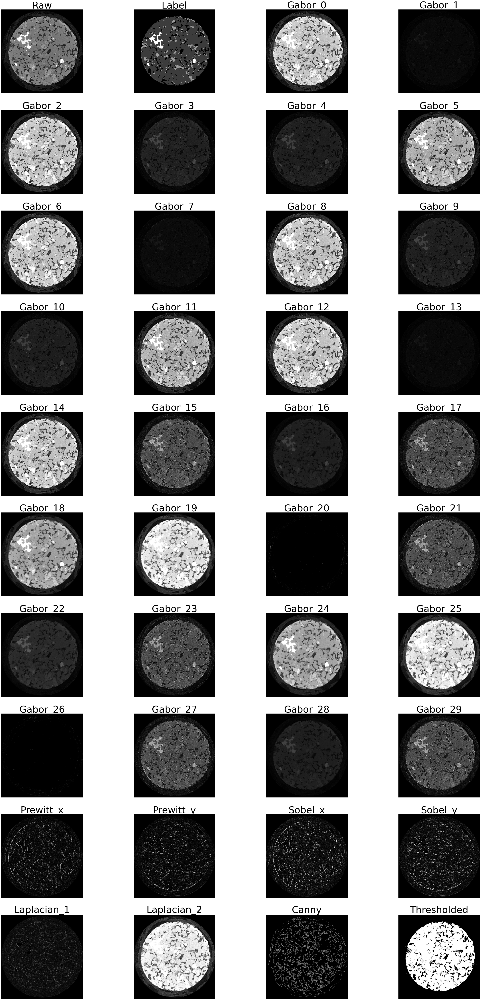

In [12]:
# Plotting the images
N = dataset.shape[1]
cols = min(4, N)
rows = int(np.ceil(N/cols))
fig, axes = plt.subplots(
    nrows=rows, ncols=cols, sharex=True, sharey=True, figsize = (50,100)
)
try:
    axes[0,1]
except:
    try:
        axes[0]
    except:
        axes = np.array([[axes]])
    else:
        axes = np.array([axes])

for idx in range(N):
    row = idx//cols
    col = idx%cols
    ax = axes[row,col]
    ax.axis("off")
    ax.set_title(dataset.columns[idx], fontsize='52')
    ax.imshow(dataset.iloc[:, idx].values.reshape(sample_img_gray.shape), cmap="gray")

for idx in range(N, cols*rows):
    row = idx//cols
    col = idx%cols
    fig.delaxes(axes[row][col])

plt.show()

## 3. Modelling

In [13]:
from sklearn.model_selection import train_test_split

y = dataset["Label"].values
X = dataset.drop(columns=["Label"]).values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate

clf = RandomForestClassifier(n_estimators=50, n_jobs=-1, random_state=42)
out = cross_validate(clf, X_train, y_train, return_estimator=True, scoring= "accuracy", cv=5)
print(out["test_score"].mean())

0.9705977147466942


## 4. Feature selection

In [15]:
aggregated_importances = pd.Series(dtype=np.float64, index = [col for col in dataset.columns if col != "Label"])
for idx,estimator in enumerate(out['estimator']):
    feature_importances = pd.Series(estimator.feature_importances_,
                                       index = [col for col in dataset.columns if col != "Label"])
    aggregated_importances = aggregated_importances.add(feature_importances, fill_value=0)
mean_importances = aggregated_importances/(idx+1)
mean_importances = mean_importances.sort_values(ascending=False)
mean_importances

Raw            0.152229
Thresholded    0.122480
Gabor_12       0.103289
Gabor_6        0.102442
Gabor_19       0.088514
Gabor_8        0.074304
Gabor_25       0.042340
Gabor_22       0.039013
Gabor_18       0.031472
Gabor_14       0.030478
Gabor_0        0.027074
Gabor_11       0.026204
Gabor_2        0.026014
Gabor_5        0.025770
Gabor_24       0.018418
Gabor_16       0.015701
Gabor_28       0.015313
Laplacian_2    0.006578
Sobel_x        0.003728
Prewitt_x      0.003672
Prewitt_y      0.003446
Gabor_9        0.003440
Canny          0.003387
Sobel_y        0.003334
Gabor_3        0.003253
Laplacian_1    0.002898
Gabor_23       0.002873
Gabor_21       0.002842
Gabor_4        0.002806
Gabor_10       0.002753
Gabor_15       0.002343
Gabor_27       0.002276
Gabor_17       0.002217
Gabor_29       0.002187
Gabor_7        0.001743
Gabor_1        0.001508
Gabor_13       0.001501
Gabor_26       0.000099
Gabor_20       0.000060
dtype: float64

In [16]:
# taking top 14 features only
important_features = mean_importances.sort_values(ascending=False).index.tolist()[:14]
important_features_idx = [dataset.drop(columns=["Label"]).columns.get_loc(c) for c in important_features]

In [17]:
X_filtered = X_train[:, important_features_idx]
out = cross_validate(clf, X_filtered, y_train, return_estimator=True, scoring= "accuracy", cv=5)
print(out["test_score"].mean())

0.9623984119415487


In [ ]:
# Using Boruta (expensive on CPU)
from boruta import BorutaPy

clf_for_boruta = RandomForestClassifier(n_estimators=10, n_jobs=-1, random_state=42)
feat_selector = BorutaPy(clf_for_boruta, random_state=42, verbose=2)

feat_selector.fit(X_train, y_train)
feat_ranks = pd.Series(feat_selector.ranking_, index=dataset.drop(columns=["Label"]).iloc[:, feat_selector.support_ ]).sort_values()

## 5. Model Evaluation

In [18]:
# fit on training data
clf.fit(X_filtered, y_train)

RandomForestClassifier(n_estimators=50, n_jobs=-1, random_state=42)

In [19]:
# testing accuracy
from sklearn.metrics import accuracy_score

y_pred = clf.predict(X_test[:, important_features_idx])
score = accuracy_score(y_pred, y_test)
print(score)

0.9618493879331899


### Model validation

In [20]:
vld_dataset_dir = "data/modelling/"
vld_raw_dir = "raw"
vld_masks_dir = "masks"

In [21]:
for filename in os.listdir(os.path.join(vld_dataset_dir, vld_raw_dir)):
    # reading image
    vld_img = cv2.imread(os.path.join(vld_dataset_dir, vld_raw_dir, filename))
    vld_img_mask = cv2.imread(os.path.join(vld_dataset_dir, vld_masks_dir, filename))
    
    # converting to grayscale
    vld_img_gray = cv2.cvtColor(vld_img, cv2.COLOR_BGR2GRAY)
    vld_img_mask_gray = cv2.cvtColor(vld_img_mask, cv2.COLOR_BGR2GRAY)
    
    # creating features and labels
    vld_dataset = pd.DataFrame()
    vld_dataset["Raw"] = vld_img_gray.reshape(-1)
    vld_dataset["Label"] = vld_img_mask_gray.reshape(-1)
    
    # augmenting features
    gabor_filtered = generate_gabor_filters(vld_dataset["Raw"].values.reshape(vld_img_gray.shape))
    edge_detected = generate_edge_detection_filters(vld_dataset["Raw"].values.reshape(vld_img_gray.shape))
    thresholded = generate_thresholded_filters(vld_dataset["Raw"].values.reshape(vld_img_gray.shape))
    vld_dataset = pd.concat([vld_dataset, gabor_filtered, edge_detected, thresholded], axis=1)
    
    # feature scaling
    y_vld = vld_dataset["Label"].values
    X_vld = vld_dataset.drop(columns=["Label"]).values
    X_vld_filtered = X_vld[:, important_features_idx]
    
    # model evaluation
    y_vld_pred = clf.predict(X_vld_filtered)
    score = accuracy_score(y_vld_pred, y_vld)
    print(f"Score for {filename}: {score}")


Score for Sandstone_Versa0000.tif: 0.9922257388930723
Score for Sandstone_Versa0350.tif: 0.9608600417294176
Score for Sandstone_Versa0400.tif: 0.9611718357806225
Score for Sandstone_Versa0150.tif: 0.9691000329442772
Score for Sandstone_Versa0250.tif: 0.9624523484563253
Score for Sandstone_Versa0050.tif: 0.9658252149221888
Score for Sandstone_Versa0300.tif: 0.9604825552208835
Score for Sandstone_Versa0200.tif: 0.9658634538152611
Score for Sandstone_Versa0100.tif: 0.9679891440763052


### Saving the model

In [25]:
import pickle
pickle.dump(clf, open("rf_model.pkl", "wb"))
print("Saved model.")

Saved model.


### Sanity test

In [27]:
# Loading the model
clf = pickle.load(open("rf_model.pkl", "rb"))

In [28]:
sanity_dataset_dir = "data/sanity/"
sanity_raw_dir = "raw"

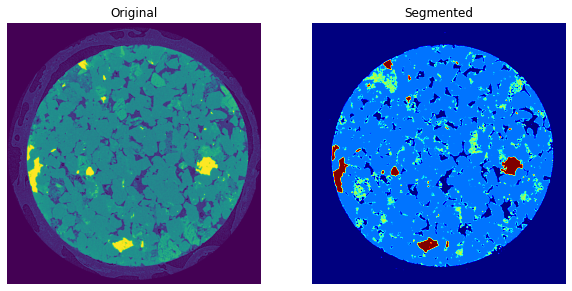

In [45]:
for filename in os.listdir(os.path.join(sanity_dataset_dir, sanity_raw_dir)):
    # reading image
    sanity_img = cv2.imread(os.path.join(sanity_dataset_dir, sanity_raw_dir, filename))
    
    # converting to grayscale
    sanity_img_gray = cv2.cvtColor(sanity_img, cv2.COLOR_BGR2GRAY)
    
    # creating features and labels
    sanity_dataset = pd.DataFrame()
    sanity_dataset["Raw"] = sanity_img_gray.reshape(-1)
    
    # augmenting features
    gabor_filtered = generate_gabor_filters(sanity_dataset["Raw"].values.reshape(sanity_img_gray.shape))
    edge_detected = generate_edge_detection_filters(sanity_dataset["Raw"].values.reshape(sanity_img_gray.shape))
    thresholded = generate_thresholded_filters(sanity_dataset["Raw"].values.reshape(sanity_img_gray.shape))
    sanity_dataset = pd.concat([sanity_dataset, gabor_filtered, edge_detected, thresholded], axis=1)
    
    # feature scaling
    X_sanity = sanity_dataset.values
    X_sanity_filtered = X_sanity[:, important_features_idx]
    
    # model evaluation
    y_sanity_pred = clf.predict(X_sanity_filtered)
    
    # plot
    fig, axes = plt.subplots(1,2, sharex=True, sharey=True, figsize=(10,8));
    axes[0].imshow(sanity_img_gray);
    axes[0].axis("off")
    axes[0].set_title("Original")
    axes[1].imshow(y_sanity_pred.reshape(sanity_img_gray.shape), cmap="jet");
    axes[1].axis("off")
    axes[1].set_title("Segmented")
    plt.axis("off")
    plt.show()